# How much is my car worth???
  - In this notebook I will show how to create a model for predicting the sale price of a used car on craigslist.
  - This model could be used by craiglist for suggesting what a user might list their car for, but also by a user to ensure they are getting a good deal on a used car.

## Links that I borrowed snippets, ideas, and inspiration from for this notebook
  - Kaggle Dataset - https://www.kaggle.com/austinreese/craigslist-carstrucks-data
  - Craiglist Scraper - https://github.com/AustinReese/craigslistFilter
  - Notebooks that inspired this post
      - https://www.kaggle.com/vbmokin/used-cars-fe-eda-with-3d-abnormals-filter
      - https://www.kaggle.com/jrw2200/smart-pricing-with-xgb-rfr-interpretations
      - https://www.kaggle.com/vbmokin/automatic-selection-from-20-classifier-models
      - https://www.kaggle.com/aantonova/some-new-risk-and-clusters-features

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots

init_notebook_mode(connected=True)

import collections

import scipy.stats as stats
from scipy.stats import norm
from scipy.special import boxcox1p

import statsmodels
import statsmodels.api as sm
#print(statsmodels.__version__)

from sklearn.preprocessing import scale, StandardScaler, RobustScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV, LinearRegression, ElasticNet,  HuberRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import accuracy_score


from xgboost import XGBRegressor, plot_importance, DMatrix

#Model interpretation modules
import lime
import lime.lime_tabular

# pandas profiling
from pandas_profiling import ProfileReport

# 1.0 Show me that Data!

## 1.1 Open Sesame

In [2]:
car_data = pd.read_csv("vehicles.csv")

In [3]:
print('Number of features: {}'.format(car_data.shape[1]))
print('Number of examples: {}'.format(car_data.shape[0]))

Number of features: 25
Number of examples: 509577


In [4]:
# data types
car_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509577 entries, 0 to 509576
Data columns (total 25 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            509577 non-null  int64  
 1   url           509577 non-null  object 
 2   region        509577 non-null  object 
 3   region_url    509577 non-null  object 
 4   price         509577 non-null  int64  
 5   year          508050 non-null  float64
 6   manufacturer  486813 non-null  object 
 7   model         501588 non-null  object 
 8   condition     277643 non-null  object 
 9   cylinders     309894 non-null  object 
 10  fuel          505592 non-null  object 
 11  odometer      417253 non-null  float64
 12  title_status  506515 non-null  object 
 13  transmission  505858 non-null  object 
 14  vin           302152 non-null  object 
 15  drive         365434 non-null  object 
 16  size          167574 non-null  object 
 17  type          368046 non-null  object 
 18  pain

In [5]:
# Take a look at a single car
sample_car = car_data.loc[52]
sample_car

id                                                     7032995718
url             https://saltlakecity.craigslist.org/ctd/d/ranc...
region                                             salt lake city
region_url                    https://saltlakecity.craigslist.org
price                                                       18999
year                                                         2015
manufacturer                                        mercedes-benz
model                                                   cla-class
condition                                               excellent
cylinders                                             4 cylinders
fuel                                                          gas
odometer                                                    37000
title_status                                                clean
transmission                                            automatic
vin                                             WDDSJ4EB3FN168594
drive     

## 1.2 It's not you, it's me.
  - Some of the columns won't help us make any decisions about the data so we will just drop them for now

In [6]:
drop_columns = ['url', 'region', 'region_url', 'title_status', 'vin', 'size', 'image_url', 'description', 'lat','long', 'paint_color', "county"]
data = car_data.drop(columns=drop_columns)

In [7]:
print('Number of features: {}'.format(data.shape[1]))
print('Number of examples: {}'.format(data.shape[0]))

Number of features: 13
Number of examples: 509577


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509577 entries, 0 to 509576
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            509577 non-null  int64  
 1   price         509577 non-null  int64  
 2   year          508050 non-null  float64
 3   manufacturer  486813 non-null  object 
 4   model         501588 non-null  object 
 5   condition     277643 non-null  object 
 6   cylinders     309894 non-null  object 
 7   fuel          505592 non-null  object 
 8   odometer      417253 non-null  float64
 9   transmission  505858 non-null  object 
 10  drive         365434 non-null  object 
 11  type          368046 non-null  object 
 12  state         509577 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 50.5+ MB


## 1.3 I don't know what I would do without you.
   - Some of the columns have some empty values.
   - We could just use dropna but then we would have many less samples
   - So instead we use ffill()
   - Ffill is going to propogate the last non-NAN value in that column.

In [10]:
# Still have some 
data = data.ffill()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509577 entries, 0 to 509576
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            509577 non-null  int64  
 1   price         509577 non-null  int64  
 2   year          509577 non-null  float64
 3   manufacturer  509577 non-null  object 
 4   model         509577 non-null  object 
 5   condition     509577 non-null  object 
 6   cylinders     509577 non-null  object 
 7   fuel          509577 non-null  object 
 8   odometer      509577 non-null  float64
 9   transmission  509577 non-null  object 
 10  drive         509577 non-null  object 
 11  type          509577 non-null  object 
 12  state         509577 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 50.5+ MB


## 1.4 Something doesn't look right...
 - Below we are going to plot the number of models for each manufacturer in the dataset. 
 - Given that I fairly certain Ford doesn't make ~7500 different types of cars, a very important attribute of this data becomes appearent if it wasn't already: this is all user-inputted data. That means that there are going to be mistakes.
 - In the case of the large number of models, it turns out that there are a bunch of different ways people list models
    - e.g. Ford 150, F150, F-150
 - We could address this, maybe using some kind of text clustering algorithm, but I'm feeling lazy and I don't want to.


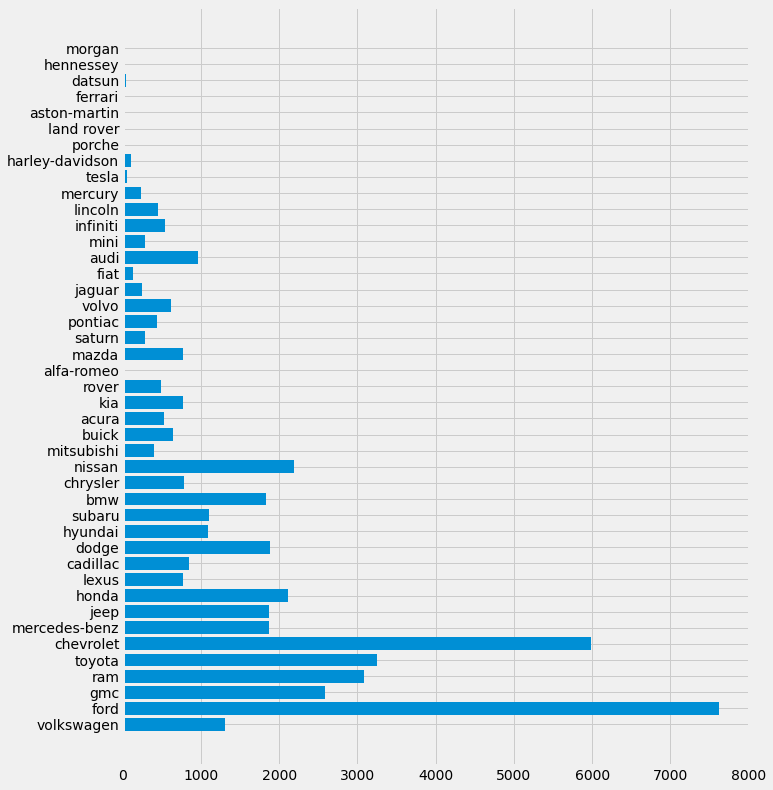

In [11]:
manufacturers = data["manufacturer"].unique()
counts = {}
for man in manufacturers:
    man_data = data[data["manufacturer"] == man]
    model_count = len(man_data["model"].unique())
    counts[man] = model_count
    
fig, ax = plt.subplots(figsize=(10,13))
ax.barh(list(counts.keys()), list(counts.values()))
plt.show()

## 1.5 Kaggle is where the cool kids hangout
  - These are two helpful functions for prepping data for a regression algorithm
  - The first performs encoding of catagorical features.
      - One might wonder why I am not using one-hot encoding and the answer is that the resulting dataset is gigantic and sparse (mostly due to number of models) and actually hurts performance.
  - The second is a fancy lil function to reduce the memory usage of a dataset by converting to numpy datatypes

In [12]:
# from the kernel: https://www.kaggle.com/vbmokin/automatic-selection-from-20-classifier-models
# Determination categorical features
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
categorical_columns = []
features = data.columns.values.tolist()
encoders = dict()
for col in features:
    if data[col].dtype in numerics: continue
    categorical_columns.append(col)
# Encoding categorical features
for col in categorical_columns:
    if col in data.columns:
        le = LabelEncoder()
        le.fit(list(data[col].astype(str).values))
        data[col] = le.transform(list(data[col].astype(str).values))

        # save encoder for later
        encoders[col] = le

In [13]:
# Thanks to : https://www.kaggle.com/aantonova/some-new-risk-and-clusters-features
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [14]:
data = reduce_mem_usage(data)

Mem. usage decreased to 16.52 Mb (67.3% reduction)


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509577 entries, 0 to 509576
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            509577 non-null  int64  
 1   price         509577 non-null  int64  
 2   year          509577 non-null  float16
 3   manufacturer  509577 non-null  int8   
 4   model         509577 non-null  int32  
 5   condition     509577 non-null  int8   
 6   cylinders     509577 non-null  int8   
 7   fuel          509577 non-null  int8   
 8   odometer      509577 non-null  float32
 9   transmission  509577 non-null  int8   
 10  drive         509577 non-null  int8   
 11  type          509577 non-null  int8   
 12  state         509577 non-null  int8   
dtypes: float16(1), float32(1), int32(1), int64(2), int8(8)
memory usage: 16.5 MB


In [16]:
data.head()

,id,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,state
0,7034441763,17899,2012.0,41,21538,0,3,2,63500.0,1,0,4,44
1,7034440610,0,2016.0,13,17901,0,3,2,10.0,0,0,4,44
2,7034440588,46463,2015.0,14,29370,0,3,2,7554.0,0,0,4,44
3,7034440546,0,2016.0,13,17901,0,3,2,10.0,0,0,4,44
4,7034406932,49999,2018.0,13,18850,0,3,0,70150.0,0,0,8,44


## 1.6 Datasets are like snowflakes
- A QQ plot is a great way to look at the distibution of your data with respect to some known distribution. In this case we are comparing the sample data to a normal distribution. We take the log of each price(technically np.log1p() for accuracy with small values) and plot the quantiles against a normal distribution.


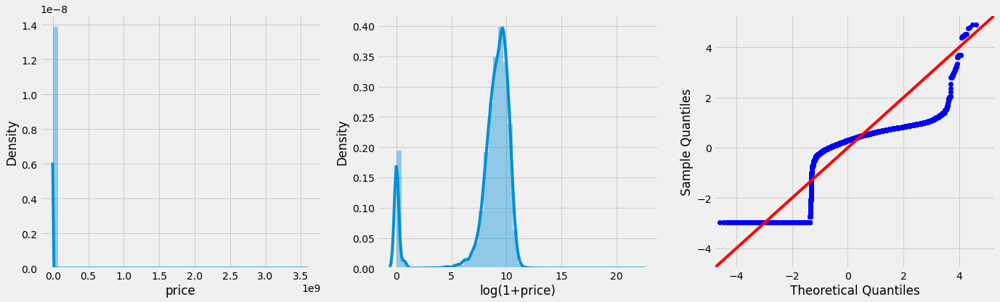

In [17]:
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(data['price'], ax=axes[0])
sns.distplot(np.log1p(data['price']), ax=axes[1])
axes[1].set_xlabel('log(1+price)')
sm.qqplot(np.log1p(data['price']), stats.norm, fit=True, line='45', ax=axes[2])
plt.show()

## 1.7 Get out of here weirdos
    - Taken from https://www.kaggle.com/vbmokin/used-cars-fe-eda-with-3d-abnormals-filter

In [18]:
def abnormal_filter(df, threshold_first, threshold_second):
    # Abnormal values filter for DataFrame df:
    # threshold_first (5%-min or max-95%)
    # threshold_second (second diff., times)
    df_describe = df.describe([.05, .1, .9, .95])
    cols = df_describe.columns.tolist()
    i = 0
    abnorm = 0
    for col in cols:
        i += 1
        # abnormal smallest
        P10_5 = df_describe.loc['10%',col]-df_describe.loc['5%',col]
        P_max_min = df_describe.loc['max',col]-df_describe.loc['min',col]
        if P10_5 != 0:
            if (df_describe.loc['5%',col]-df_describe.loc['min',col])/P10_5 > threshold_second:
                #abnormal smallest filter
                df = df[(df[col] >= df_describe.loc['5%',col])]
                print('1: ', i, col, df_describe.loc['min',col],df_describe.loc['5%',col],df_describe.loc['10%',col])
                abnorm += 1
        else:
            if P_max_min > 0:
                if (df_describe.loc['5%',col]-df_describe.loc['min',col])/P_max_min > threshold_first:
                    # abnormal smallest filter
                    df = df[(df[col] >= df_describe.loc['5%',col])]
                    print('2: ', i, col, df_describe.loc['min',col],df_describe.loc['5%',col],df_describe.loc['max',col])
                    abnorm += 1

        
        # abnormal biggest
        P95_90 = df_describe.loc['95%',col]-df_describe.loc['90%',col]
        if P95_90 != 0:
            if (df_describe.loc['max',col]-df_describe.loc['95%',col])/P95_90 > threshold_second:
                #abnormal biggest filter
                df = df[(df[col] <= df_describe.loc['95%',col])]
                print('3: ', i, col, df_describe.loc['90%',col],df_describe.loc['95%',col],df_describe.loc['max',col])
                abnorm += 1
        else:
            if P_max_min > 0:
                if ((df_describe.loc['max',col]-df_describe.loc['95%',col])/P_max_min > threshold_first) & (df_describe.loc['95%',col] > 0):
                    # abnormal biggest filter
                    df = df[(df[col] <= df_describe.loc['95%',col])]
                    print('4: ', i, col, df_describe.loc['min',col],df_describe.loc['95%',col],df_describe.loc['max',col])
                    abnorm += 1
    print('Number of abnormal values =', abnorm)
    return df

In [19]:
norm_data = abnormal_filter(data, .5, 3)
norm_data.info()

1:  1 id 6995212189.0 7034271050.4 7036339154.6
3:  2 price 27980.0 34854.0 3600028900.0
1:  3 year 1900.0 1998.0 2002.0
3:  9 odometer 180303.0 208000.0 10000000.0
Number of abnormal values = 4
<class 'pandas.core.frame.DataFrame'>
Int64Index: 416973 entries, 0 to 509576
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            416973 non-null  int64  
 1   price         416973 non-null  int64  
 2   year          416973 non-null  float16
 3   manufacturer  416973 non-null  int8   
 4   model         416973 non-null  int32  
 5   condition     416973 non-null  int8   
 6   cylinders     416973 non-null  int8   
 7   fuel          416973 non-null  int8   
 8   odometer      416973 non-null  float32
 9   transmission  416973 non-null  int8   
 10  drive         416973 non-null  int8   
 11  type          416973 non-null  int8   
 12  state         416973 non-null  int8   
dtypes: float16(1), float32(1), in

In [20]:
norm_data = norm_data[norm_data["price"] >= 1000]
norm_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 365639 entries, 0 to 509576
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            365639 non-null  int64  
 1   price         365639 non-null  int64  
 2   year          365639 non-null  float16
 3   manufacturer  365639 non-null  int8   
 4   model         365639 non-null  int32  
 5   condition     365639 non-null  int8   
 6   cylinders     365639 non-null  int8   
 7   fuel          365639 non-null  int8   
 8   odometer      365639 non-null  float32
 9   transmission  365639 non-null  int8   
 10  drive         365639 non-null  int8   
 11  type          365639 non-null  int8   
 12  state         365639 non-null  int8   
dtypes: float16(1), float32(1), int32(1), int64(2), int8(8)
memory usage: 14.6 MB


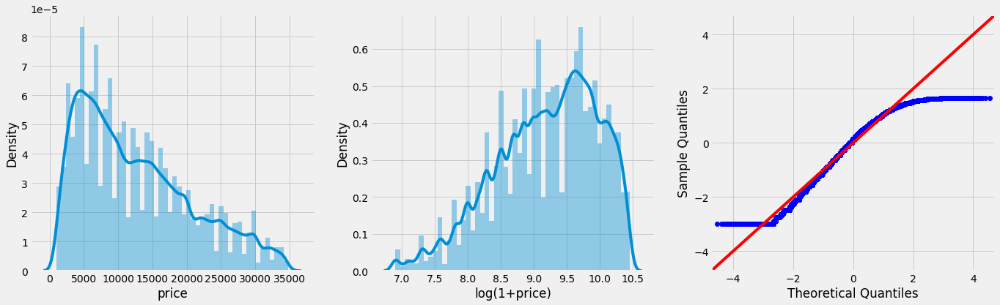

In [21]:
fig, axes = plt.subplots(1,3, figsize=(21,6))
sns.distplot(norm_data['price'], ax=axes[0])
sns.distplot(np.log1p(norm_data['price']), ax=axes[1])
axes[1].set_xlabel('log(1+price)')
sm.qqplot(np.log1p(norm_data['price']), stats.norm, fit=True, line='45', ax=axes[2])
plt.show()

In [22]:
norm_data["price"] = np.log1p(norm_data["price"])
norm_data["odometer"] = np.log1p(norm_data["odometer"])
norm_data.head()

,id,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,state
0,7034441763,9.792556,2012.0,41,21538,0,3,2,11.058811,1,0,4,44
5,7034406582,9.546813,2009.0,35,18850,0,3,2,11.695730,0,0,8,44
6,7034405619,10.448744,2017.0,13,18647,0,3,0,11.466724,0,0,8,44
7,7034405349,9.581973,2007.0,14,29368,0,3,2,11.400216,0,0,8,44
9,7034401857,10.448744,2012.0,35,18417,0,3,0,11.760988,0,0,8,44


## 1.6 Correlations in the data
 So I would expect correlations between mileage(odometer) and price. Lets plot a correlation matrix to see if that is true

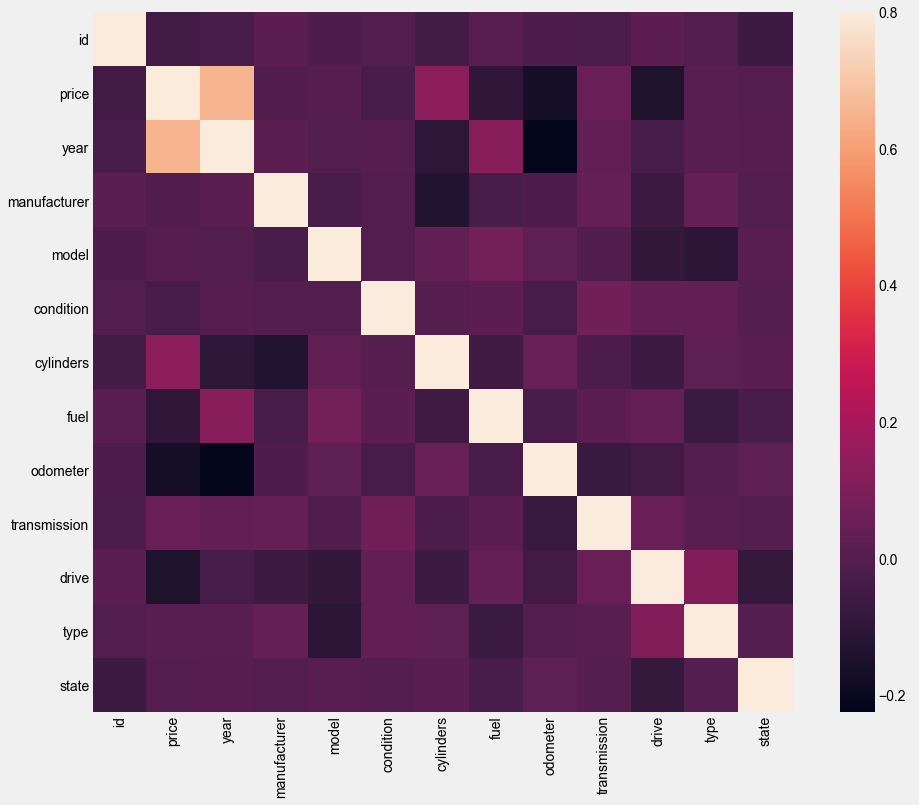

In [23]:
corrmatrix = norm_data.corr()
f, ax = plt.subplots(figsize=(15,12))
sns.heatmap(corrmatrix, vmax=0.8, square=True)
sns.set(font_scale=0.8)

## Correlations
  - So a few things here.
    - First, negative correlations between price and odometer as well as odometer and year. These both make intuitive sense as the older the car the more likely it has alot of miles put on it and the more miles, the less the car is worth in a kelly blue book sense of the word.
    - Second, a positive correlation between price and year meaning as the year goes up, the price will go up. This also makes sense as newer cars are more valuable.
  - So nothing too shocking here, we will see more of this in our profile


## 1.8 The good kind of profiling
  - One of the cooler tools in the EDA toolbox these days is Pandas Profiling
  - Basically, it just generates an html report of your CSV. It could not be easier to use.
  - The one downside it has is that it is extremely slow for large datasets.

In [24]:
repor = ProfileReport(norm_data, title='Craigslist Car Data Report')
repor

# 2.0 Isn't this supposed to be about Machine Learning?
   - Yes! finally! We get to train some models!!!

## 2.1 You thought!
  - Were close I can feel it!
  - Drop targets, split dataset, and normalize

In [25]:
prices = norm_data["price"]
sample_data = norm_data.drop(["price", "id"], axis=1)
sample_data.head()

,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,state
0,2012.0,41,21538,0,3,2,11.058811,1,0,4,44
5,2009.0,35,18850,0,3,2,11.695730,0,0,8,44
6,2017.0,13,18647,0,3,0,11.466724,0,0,8,44
7,2007.0,14,29368,0,3,2,11.400216,0,0,8,44
9,2012.0,35,18417,0,3,0,11.760988,0,0,8,44


In [26]:
X_train, X_test, y_train, y_test = train_test_split(sample_data, prices, test_size=0.2, random_state=42)
print('Dimensions of the training feature matrix: {}'.format(X_train.shape))
print('Dimensions of the training target vector: {}'.format(y_train.shape))
print('Dimensions of the test feature matrix: {}'.format(X_test.shape))
print('Dimensions of the test target vector: {}'.format(y_test.shape))

Dimensions of the training feature matrix: (292511, 11)
Dimensions of the training target vector: (292511,)
Dimensions of the test feature matrix: (73128, 11)
Dimensions of the test target vector: (73128,)


In [27]:
scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

## 2.2 Lets just throw some models at it!
 - Train multiple models with RMSE loss
 - Use 5-fold validation

In [28]:
n_folds = 5

# squared_loss
def rmse_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=7)
    return cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf)


In [29]:
for Model in [LinearRegression, Ridge, Lasso, ElasticNet, XGBRegressor, HuberRegressor]:
    if Model == XGBRegressor:
        cv_res = rmse_cv(XGBRegressor(objective='reg:squarederror'))
    else:
        cv_res = rmse_cv(Model())
    print('{}: {:.5f} +/- {:5f}'.format(Model.__name__, -cv_res.mean(), cv_res.std()))

LinearRegression: 0.28418 +/- 0.001422
Ridge: 0.28418 +/- 0.001422
Lasso: 0.58279 +/- 0.002015
ElasticNet: 0.58279 +/- 0.002015
XGBRegressor: 0.11980 +/- 0.001524
HuberRegressor: 0.28620 +/- 0.001670


## 2.3 Suprise suprise, XGB does the best on a regression problem
   - XGB is pretty elite in when it comes to regression problems.

In [30]:
parms = {
    'max_depth'        : 8, 
    'objective'        : 'reg:squarederror',
    'eta'              : 0.3,
    'subsample'        : 0.8, 
    'colsample_bylevel': 1,
    'min_child_weight' : 10
}
# start here
model = XGBRegressor(**parms)
model.fit(X_train, y_train)
y_train_rf = model.predict(X_train)
y_test_rf = model.predict(X_test)
rf_results = pd.DataFrame({'algorithm':['XGBRegressor'],
            'training error': [mean_squared_error(y_train, y_train_rf)],
            'test error': [mean_squared_error(y_test, y_test_rf)],
            'training_r2_score': [r2_score(y_train, y_train_rf)],
            'test_r2_score': [r2_score(y_test, y_test_rf)]})
rf_results

,algorithm,training error,test error,training_r2_score,test_r2_score
0,XGBRegressor,0.091848,0.111375,0.842398,0.807586


# 3.0 Explainability tools (aka... is it really learning though?)
  - In this section im going to use a few tools to make sure that our XGB model is learning what it's supposed to.

## 3.1 XGBoost comes with one? Sweet.
  - The built in feature importance mechanism for XGBoost is pretty good, but should not be used alone to describe an XGBoost algos predictions.
  - In basic terms, this graph shows the impact of each feature on the models predictions. The F-Score reflects the number of times that the feature is "split on" in the decision trees within the XGB model. 


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

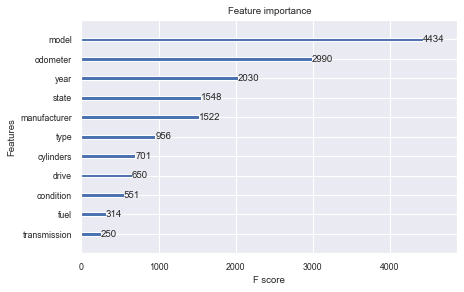

In [31]:
# create dfs for feature names. its just easier
x_train_df = pd.DataFrame(X_train, columns=sample_data.columns)
importance_model = XGBRegressor(**parms)
importance_model.fit(x_train_df, y_train)
plot_importance(importance_model)

### 3.1.1 That almost looks right.
  - So the thing to point out here is that you might notice that this implies that the model is the most important feature to XGB.
  - But actually it's just about how many times the XGB model "splits" on a certain feature. I think in this case, because of the sheer number of different model types (as mentioned earlier), XGB just splits on the models many times.
  - Also important is that the odometer and year are the second most important. This goes in line with the EDA we did earlier so this makes sense to me.

## 3.2 Put the LIME in the coconut
  - Here we will use LIME to explain the results of the XGBboost algo.

In [32]:
# using lime
explainer = lime.lime_tabular.LimeTabularExplainer(X_train,
                                                   feature_names=sample_data.columns.values,
                                                   class_names=['price'],
                                                   verbose=True,
                                                   mode='regression')


In [33]:
i = 36
exp_1 = explainer.explain_instance(X_test[i], model.predict, num_features=10)
item = pd.DataFrame(scaler.inverse_transform(X_test[i].reshape(1,-1)), columns=sample_data.columns)
item['odometer'] = np.expm1(item['odometer'])
item['true_price'] = np.expm1(y_test.iloc[i])
item['predicted_price'] = np.exp(exp_1.local_pred)
item["manufacturer"] = encoders["manufacturer"].inverse_transform(item["manufacturer"].values.astype(int))
item["model"] = encoders["model"].inverse_transform(item["model"].values.astype(int))
item["condition"] = encoders["condition"].inverse_transform(item["condition"].values.astype(int))
item["transmission"] = encoders["transmission"].inverse_transform(item["transmission"].values.astype(int))
item["type"] = encoders["type"].inverse_transform(item["type"].values.astype(int))
item["drive"] = encoders["drive"].inverse_transform(item["drive"].values.astype(int))
item["state"] = encoders["state"].inverse_transform(item["state"].values.astype(int))
item["cylinders"] = encoders["cylinders"].inverse_transform(item["cylinders"].values.astype(int))
item["fuel"] = encoders["fuel"].inverse_transform(item["fuel"].values.astype(int))
item.T

Intercept 9.44900926219078
Prediction_local [8.33121834]
Right: 9.3595495


,0
year,2000
manufacturer,ford
model,excursion
condition,good
cylinders,8 cylinders
fuel,diesel
odometer,183000
transmission,automatic
drive,4wd
type,SUV


In [34]:
exp_1.show_in_notebook(show_table=True)

## A great example of why human-inputted data is tough for ML

  - So here we have someone who thinks their Ford Excursion is worth $10000 even though it has almost 200000 miles on it.
  - The kelly blue book for this car is somewhere between 2000 and 4000 dollars. 
  - The XGB model predicted a price of 4079 which is pretty close to the high end of the kelly blue book value.
  - LIME states that the year and odometer were the two biggest reasons for the low price. this makes sense because the car has alot of miles and is 20 years old.

In [36]:
i = 38
exp_2 = explainer.explain_instance(X_test[i], model.predict, num_features=10)
item = pd.DataFrame(scaler.inverse_transform(X_test[i].reshape(1,-1)), columns=sample_data.columns)
item['odometer'] = np.expm1(item['odometer'])
item['true_price'] = np.expm1(y_test.iloc[i])
item['predicted_price'] = np.exp(exp_2.local_pred)
item["manufacturer"] = encoders["manufacturer"].inverse_transform(item["manufacturer"].values.astype(int))
item["model"] = encoders["model"].inverse_transform(item["model"].values.astype(int))
item["condition"] = encoders["condition"].inverse_transform(item["condition"].values.astype(int))
item["transmission"] = encoders["transmission"].inverse_transform(item["transmission"].values.astype(int))
item["type"] = encoders["type"].inverse_transform(item["type"].values.astype(int))
item["drive"] = encoders["drive"].inverse_transform(item["drive"].values.astype(int))
item["state"] = encoders["state"].inverse_transform(item["state"].values.astype(int))
item["cylinders"] = encoders["cylinders"].inverse_transform(item["cylinders"].values.astype(int))
item["fuel"] = encoders["fuel"].inverse_transform(item["fuel"].values.astype(int))
item.T

Intercept 9.307910947491992
Prediction_local [8.26210399]
Right: 9.4034195


,0
year,2003
manufacturer,chevrolet
model,c7500
condition,excellent
cylinders,6 cylinders
fuel,diesel
odometer,152252
transmission,automatic
drive,rwd
type,convertible


In [37]:
exp_2.show_in_notebook(show_table=True)

## A convertible truck? Hold on..
  - So this is a great example of pd.DataFrame.ffill coming back to bite me
  - Because we filled the missing values with ffill, sometimes we will have places in the data that don't make sense.
  - usually this is ok as long as the features that you are ffill'ing arent that important to the model.
  - as you can see here, "type" is filled with convertible. Just google Chevy c7500 and you can immediately tell that this is not a convertible.
  - Luckily, type doesn't seem that important in the eyes of the XGB feature importance nor LIMEs explainations.
  - that being said, there are not many c7500 trucks in this dataset so the model makes a relatively poor decision because of the high miles and the year being 2003.
  - without more samples, or alot more effort, theres little we can do about this. Moving on.

In [40]:
i = 42
exp_3 = explainer.explain_instance(X_test[i], model.predict, num_features=10)
item = pd.DataFrame(scaler.inverse_transform(X_test[i].reshape(1,-1)), columns=sample_data.columns)
item['odometer'] = np.expm1(item['odometer'])
item['true_price'] = np.expm1(y_test.iloc[i])
item['predicted_price'] = np.exp(exp_3.local_pred)
item["manufacturer"] = encoders["manufacturer"].inverse_transform(item["manufacturer"].values.astype(int))
item["model"] = encoders["model"].inverse_transform(item["model"].values.astype(int))
item["condition"] = encoders["condition"].inverse_transform(item["condition"].values.astype(int))
item["transmission"] = encoders["transmission"].inverse_transform(item["transmission"].values.astype(int))
item["type"] = encoders["type"].inverse_transform(item["type"].values.astype(int))
item["drive"] = encoders["drive"].inverse_transform(item["drive"].values.astype(int))
item["state"] = encoders["state"].inverse_transform(item["state"].values.astype(int))
item["cylinders"] = encoders["cylinders"].inverse_transform(item["cylinders"].values.astype(int))
item["fuel"] = encoders["fuel"].inverse_transform(item["fuel"].values.astype(int))
item.T

Intercept 8.895737048280099
Prediction_local [9.76678167]
Right: 9.769727


,0
year,2017
manufacturer,kia
model,niro fe wagon 4d
condition,good
cylinders,6 cylinders
fuel,hybrid
odometer,24147
transmission,automatic
drive,fwd
type,wagon


In [41]:
exp_3.show_in_notebook(show_table=True)

## Alright Alright Alrightttt
  - So we got pretty close to the posting price on this one!
  - So by now we can tell that the XGB model made some stark splits on odometer and year. Each prediction explained by LIME has odometer and year as the top two for most impactful features.
  - This makes sense after we saw the correlations and XGB feature importance earlier.
  - oddly enough it also doesn't value diesel cars. This would lead me to believe that there are more diesel cars in the dataset are cheaper on average than the gas powered.

# 4.0 Did I mess something up? Tell me!
   - Please if I messed anything up or if you have a better way to do anything that I did here, please file an issue in this repo.
   - thanks!